## Exercise 6 - Fourier Transforms

### Introduction

In this exercise we will study two very versatile and useful transforms and see some examples of their uses in remote sensing using Python.

### How to use this Jupyter Notebook

The Jupyter Notebook is composed by a series of *cells*, each one containing either Python code or text instructions.
The text instruction that you are currently reading here are inside a *text cell*.

To run a cell, just click on it and then press the `Run` button at the top of the screen, or use the shortcut `Shift - Enter`.

You will not need to run *text cells*.
Only cells containing Python code need to be run.
Make sure that you will execute *code cells* in descending order, from the beginning of this Jupyter Notebook to its end. 
Since this Jupyter Notebook runs online, you will not need to install anything on your personal computer.

You are not required to have prior Python programming knowledge. All you will have to do is to modify the value of some quantities (or *variables*) to achieve the result requested by each section of the exercise. You will have to interpret these results to answer the questions of the exercise. However, if you want to experiment with the code provided, feel free to edit the code: the changes that you make will not overwrite the original copy of the notebook. When logged in through EPFL's Noto platform, your changes will be saved to your session.

**Variables that will need to be modified will be defined in UPPERCASE and preceeded by a comment indicating the request**

A comment is a line of code preceeded by the symbol *#*.
For example:

    # This is a comment

A variable that you will be required to modify will look like the following example:
    
    # Modify the value of the following variable
    VARIABLE_TO_MODIFY = 2

To modify the variable, change the value after the = sign. For example:

    VARIABLE_TO_MODIFY = 3

will change the value of *VARIABLE_TO_MODIFY* from *2* to *3*.

### Note memory consumption

Across the exercise, we provide several code cells that "reset" the notebook, clearing up some RAM memory space. In theory, those should be sufficient to execute the exercise on EPFL Noto.
If you still encounter a high memory consumption, we suggest two approaches:
- Clear all current outputs by clicking on `Cell` -> `All Output` -> `Clear`.
- Re-start the kernel by clicking on `Kernel` -> `Restart & Clear Output`.

In both cases, you will need to continue with the exercise from the cell that loads the python libraries immediately precceding the part of the exercise you will be working on.
By *loading the libraries* we mean the code cells containing lines of codes such as:

    import numpy as np
    import PIL.Image

#### Start the exercise by running the next cell: it will import the libraries needed for the exercise.

In [1]:
import os                        # Library to perform operating system operations
import numpy as np               # Library to perform array/tensor manipulation
import PIL.Image                 # Library to manipulate images
import matplotlib.pyplot as plt  # Library to plot and create figures
plt.rcParams['font.size'] = 15   # This set the fontsize of the figure 

# Create the directory 'Figures' if does not yet exist
if not os.path.exists('Figures'):
    os.mkdir('Figures')
plt.rcParams['figure.facecolor']='white'

## 1. 2D Fourier transform and global enhancement

The Fourier transform decomposes a signal into its main constituting frequencies.

Besides the rich additional information it gives about the signal, it is also a very convenient tool for signal filtering and processing.
This section shows some properties of the 2D Fourier transform as well as some examples of usage for remote sensing data, in particular satellite images.

### 1.1 Study of the 2D Fourier transform

In this exercise we will study the Fourier transform of an aerial image of La Chaux-de-Fonds (NE) (source: Google maps).
This city in the Swiss Jura, close to the French border, has an interesting city plan.
As the watchmaking industry developed in the late 18th and in the 19th century, the city expanded and buildings were constructed following a grid plan. 
While this is frequent in American cities, it is more rare in Europe.

We will then observe the effects of rotation and translation of the image on the frequency spectrum.

Now, let's start loading the image by running the following cell.
There is no need to modify anything for the moment: the code will load and display the image for you.

Image size in pixel:  (600, 600)


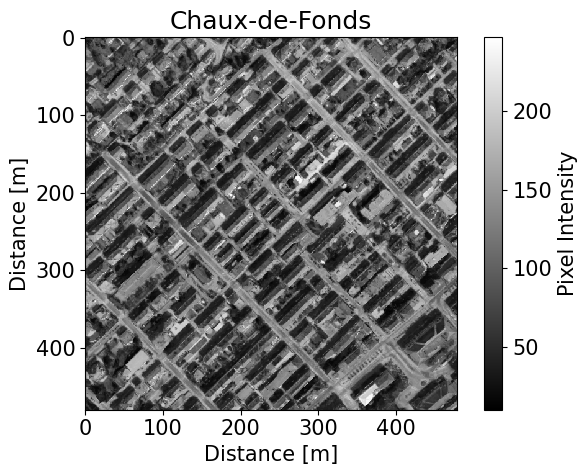

In [2]:
# Loading the image
img = np.array(PIL.Image.open("Data/1_Fourier/la_chaux_de_fonds.png"))

# Shape of the image 
print('Image size in pixel: ', img.shape)
 
#  Resolution of a pixel
pix_res = 0.8 # m (equivalent length of a pixel)

# Computing x and y coordinates in meters
dim_x = img.shape[0]
dim_y = img.shape[1]
new_x = np.arange(0, dim_x) * pix_res
new_y = np.arange(0, dim_y) * pix_res

# Displaying the image
fig, ax = plt.subplots(1,1,figsize=(6.5,5))
ax.set_aspect('equal')
mappable = ax.pcolormesh(new_x, new_y, img, cmap='gray', shading='auto')
plt.sca(ax)
ax.invert_yaxis()
plt.colorbar(mappable=mappable, label='Pixel Intensity')
ax.set_xlabel('Distance [m]')
ax.set_ylabel('Distance [m]')
ax.set_title('Chaux-de-Fonds')
plt.tight_layout()
plt.show()

Run the next cell to perform the Fourier transform of the image just loaded and visualize the frequency spectrum.

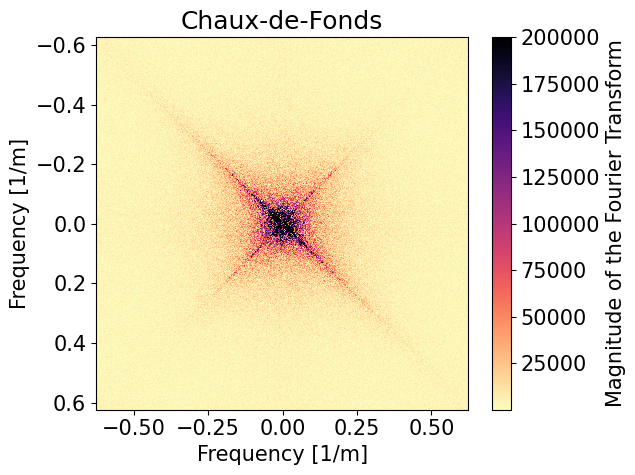

In [3]:
# Perform the Fourier transform
img_fft = np.fft.fft2(img)

# Define the resolution of a pixel
pix_res = 0.8 # m (equivalent length of a pixel)

# Shift the zero-frequency component to the center of the spectrum
img_fft_centered = np.fft.fftshift(img_fft)

# Define the shifted coordinates array 
dim_x = img_fft_centered.shape[1]
dim_y = img_fft_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# Retrieve the magnitude of the frequency spectrum  
img_fft_centered_magnitude = np.absolute(img_fft_centered)

# Display the magnitude of the frequency spectrum
fig, ax = plt.subplots(1,1,figsize=(6.5,5))
ax.set_aspect('equal')


mappable = ax.pcolormesh(new_x, new_y, img_fft_centered_magnitude.T,
                         cmap='magma_r',   # Name of the colormap to employ 
                         vmin=1, vmax=2e5, # Lower and upper bounds of the colormap 
                         shading = "auto") 
plt.sca(ax)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform')
ax.set_xlabel('Frequency [1/m]')
ax.set_ylabel('Frequency [1/m]')
ax.set_title('Chaux-de-Fonds')
plt.tight_layout()

## If you want to crop the image, just uncomment the following lines (remove the # sign and adjust the axis limit values)
#plt.xlim(-0.3,0.3) # to crop the image
#plt.ylim(-0.3,0.3)

ax.invert_yaxis()
fig.savefig('Figures/cdf_fourier',dpi=300,bbox_inches='tight')

##### Looking at both the original aerial image and its Fourier transform, you will be able to answer the first question of the exercise.


> **Question 1**: Describe the figure. What are the axes with the dominant frequencies? To which features do they correspond in the image?


In the following cell we will load two copies of the original image. As you will see, both were **resized with a scale of 1/2** (so the size of the area on the ground covered by one pixel is larger), while keeping the same number of total pixels (filling up with gray pixels); then, the images were **translated in two different directions**.

Run the cell to perform the Fourier transforms and visualize the results side by side with the input images.

Image size in pixel:  (600, 600)


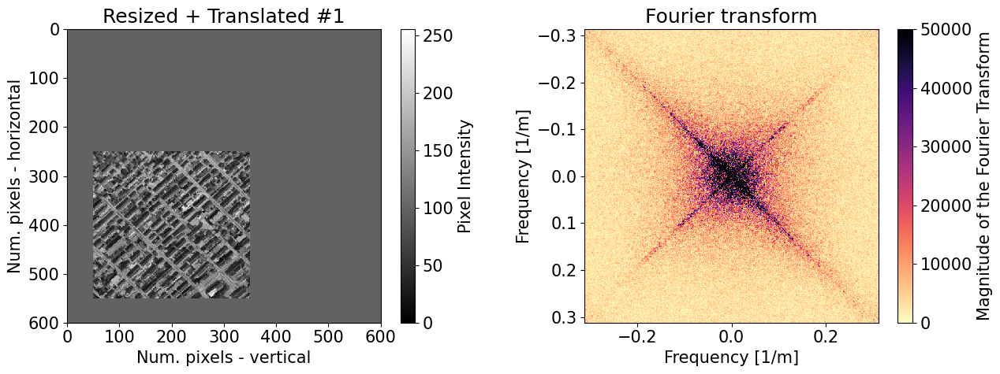

In [4]:
# Loading the FIRST image
img_translated = np.array(PIL.Image.open("Data/1_Fourier/la_chaux_de_fonds_scaled_translated.png"))

# Shape of the image 
print('Image size in pixel: ', img_translated.shape)
 
# Resolution of a pixel: twice the previous one because the image was scaled by a factor 1/2
pix_res = 1.6 # m 

# Perform the Fourier transform
img_translated_fft = np.fft.fft2(img_translated)

# Shift the zero-frequency component to the center of the spectrum
img_translated_fft_centered = np.fft.fftshift(img_translated_fft)

# Define the shifted coordinates array 
dim_x = img_translated_fft_centered.shape[1]
dim_y = img_translated_fft_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# Retrieve the magnitude of the frequency spectrum 
img_translated_fft_centered_magnitude = np.absolute(img_translated_fft_centered)

# Plot the rescaled & resized image and the corresponding magnitude spectrum
fig, axes = plt.subplots(1,2,figsize=(13,5))

ax0 = axes[0]
mappable0 = ax0.pcolormesh(img_translated, cmap='gray', vmin=0, vmax=255)
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity')
ax0.set_xlabel('Num. pixels - vertical')
ax0.set_ylabel('Num. pixels - horizontal')
ax0.set_title('Resized + Translated #1')
ax0.invert_yaxis()

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x, new_y, img_translated_fft_centered_magnitude, 
                          cmap='magma_r',
                          vmin=0., vmax=.5e5,
                          shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform')
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform')
plt.tight_layout()
plt.show()
fig.savefig('Figures/cdf_fourier_resized_translated.png',dpi=300,bbox_inches='tight')


Image size in pixel:  (600, 600)


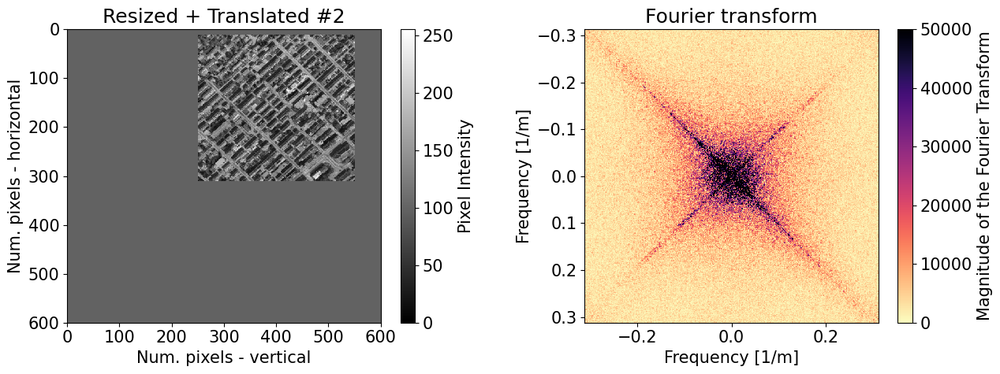

In [5]:
############################################################################################################33333
# Loading the SECOND image
img_translated2 = np.array(PIL.Image.open("Data/1_Fourier/la_chaux_de_fonds_scaled_translated2.png"))

# Shape of the image 
print('Image size in pixel: ', img_translated2.shape)
 
# Perform the Fourier transform
img_translated_fft2 = np.fft.fft2(img_translated2)

# Shift the zero-frequency component to the center of the spectrum
img_translated_fft_centered2 = np.fft.fftshift(img_translated_fft2)

# Define the shifted coordinates array 
dim_x2 = img_translated_fft_centered2.shape[1]
dim_y2 = img_translated_fft_centered2.shape[0]
new_x2 = np.arange(-np.floor(dim_x2/2.), np.floor(dim_x2/2.)) / pix_res / dim_x2
new_y2 = np.arange(-np.floor(dim_y2/2.), np.floor(dim_y2/2.)) / pix_res / dim_y2

# Retrieve the magnitude of the frequency spectrum 
img_translated_fft_centered_magnitude2 = np.absolute(img_translated_fft_centered2)

# Plot the rescaled & resized image and the corresponding magnitude spectrum
fig, axes = plt.subplots(1,2,figsize=(13,5))

ax0 = axes[0]
mappable0 = ax0.pcolormesh(img_translated2, cmap='gray', vmin=0, vmax=255)
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity')
ax0.set_xlabel('Num. pixels - vertical')
ax0.set_ylabel('Num. pixels - horizontal')
ax0.set_title('Resized + Translated #2')
ax0.invert_yaxis()

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x2, new_y2, img_translated_fft_centered_magnitude2, 
                          cmap='magma_r',
                          vmin=0., vmax=.5e5,
                          shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform')
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform')
plt.tight_layout()
plt.show()
# fig.savefig('Figures/cdf_fourier_resized_translated2.png',dpi=300,bbox_inches='tight')

Looking at the Fourier transform of:
- the original image
- the resized and translated images

Compare the results and answer the following questions:

> **Question 2**: How do the Fourier transforms of the translated and resized images ressemble, and differ, from that of the original aerial image? Compare the magnitude of the Fourier spectrum for the original and the two resized + translated images. What do you observe?

> **Question 3**: Based on your understanding of the Fourier transform, explain the features you observed.

We repeat the operation once again for an image that has also been rotated of 30° (in addition to being resized and translated).

Run the following cell to perform its Fourier transform and visualize the results side by side with the input image.

Image size in pixel:  (600, 600)


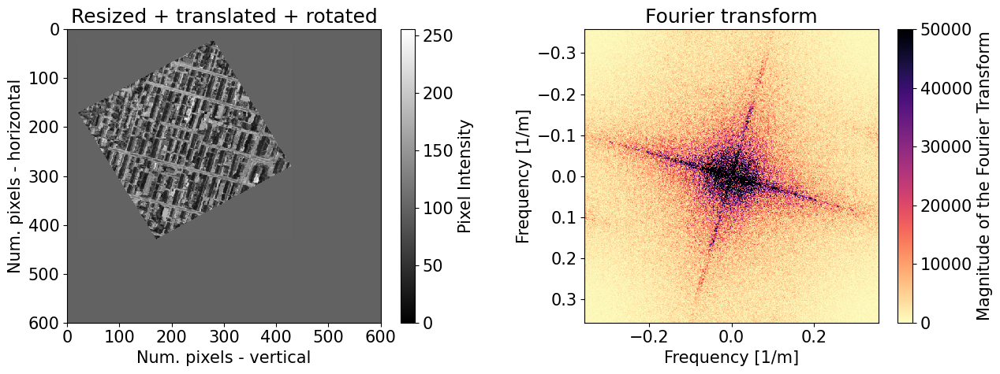

In [6]:
# Loading the image
img_rotated = np.array(PIL.Image.open("Data/1_Fourier/la_chaux_de_fonds_scaled_translated_rotated.png"))

# Shape of the image 
print('Image size in pixel: ', img_rotated.shape)

#  Resolution of a pixel ## Re-calculated after rotation of the image
pix_res = 1.4 # m

# Perform the Fourier transform
img_rotated_fft = np.fft.fft2(img_rotated)

# Shift the zero-frequency component to the center of the spectrum
img_rotated_fft_centered = np.fft.fftshift(img_rotated_fft)

# Define the shifted coordinates array 
dim_x = img_rotated_fft_centered.shape[1]
dim_y = img_rotated_fft_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# Retrieve the magnitude of the frequency spectrum 
img_rotated_fft_centered_magnitude = np.absolute(img_rotated_fft_centered)

# Plot the rotated & rescaled & resized image and the corresponding magnitude spectrum
fig, axes = plt.subplots(1,2,figsize=(13,5))

ax0 = axes[0]
mappable0 = ax0.pcolormesh(img_rotated, cmap='gray', vmin=0, vmax=255)
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity')
ax0.set_xlabel('Num. pixels - vertical')
ax0.set_ylabel('Num. pixels - horizontal')
ax0.set_title('Resized + translated + rotated')
ax0.invert_yaxis()

ax1 = axes[1]
ax1.set_aspect('equal')
mappable = ax1.pcolormesh(new_x, new_y, img_rotated_fft_centered_magnitude,
                          cmap='magma_r',
                          vmin=0, vmax=.5e5, 
                          shading='auto')
plt.sca(ax1)
ax1.invert_yaxis()
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform')
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform')

plt.tight_layout()
plt.show()
fig.savefig('Figures/cdf_fourier_rotated.png',dpi=300,bbox_inches='tight')

Looking at the Fourier transform of:
- the original image
- the rotated (and resized + translated) image

Compare the results and answer the following question:

> **Question 4**: Explain how the rotated image differs, in the Fourier domain, from the original aerial image. Does the rotation affect the Fourier transform differently from the sole translation + resizing? 

We are now at the end of the subsection.
Let's clear up the workspace: run the next cell to remove all variables, and re-load the needed libraries.

In [2]:
# Let's clear up the workspace
%reset -sf

# And re-loading the libraries
import numpy as np                     # Array manipulation
import PIL.Image                       # Manipulation of images
import matplotlib.pyplot as plt        # Plotting
from matplotlib.patches import Circle  # For drawing circles on the plots
plt.rcParams['font.size'] = 15   # This set the fontsize of the figure 
plt.rcParams['figure.facecolor']='white'

### 1.2 Filtering in the frequency domain

In this exercise we will see how to perform a simple image filtering operation on the Fourier transform.

We will perform the filtering on the Fourier transform of the *la_chaux_de_fonds.png* image, obtained in Subsection 1.1.

First of all, we will define a simple function to perform the filtering.
This function takes the following arguments:
- **im_fft**, the Fourier transform of the image that we want to filter
- **filter_type**, the type of filter, which can be either “lowpass” or “highpass”
- **cut_freq**, the cutting frequency in [1/m]
- **pix_res**, the pixel resolution in [m] (default 0.8 m)

Note on frequency: If the resolution of the image is, for example, approximately 0.4 meters, a frequency of 1/2 [1/m] corresponds to a frequency of 1 every 5 pixels.

In [3]:
def fft_filter(im_fft, filter_type, cut_freq, pix_res=0.8):
    '''
    Simple filtering on the Fourier transform
    
    
    Parameters
    ----------
    im_fft : complex numpy array (2D)
        The Fourier transform of the image to filter
    filter_type : string
        Type of filter, “lowpass” or “highpass”
    cut_freq : float
        Cutting frequency in [1/m]
    pix_res : float
        Pixel resolution in [m]
        
    Returns
    -------
    im_filt : complex numpy array (2D)
        The filtered image (complex array). Compute the absolute value before visualizing.
    filt_fft : complex numpy array (2D)
        The masked Fourier transform used to perform the filtering
    '''
    dim_x = im_fft.shape[1]
    dim_y = im_fft.shape[0]

    new_x = np.fft.fftfreq(dim_x) / pix_res
    new_y = np.fft.fftfreq(dim_y) / pix_res

    x2d, y2d = np.meshgrid(new_x, new_y)
    freq = np.sqrt(np.square(x2d) + np.square(y2d))
    
    if filter_type == 'lowpass':
        freq_mask = freq < cut_freq
    elif filter_type == 'highpass':
        freq_mask = freq > cut_freq
    else:
        # In case of invalid input
        print('ERROR: Invalid parameter for filter type.')
        empty_return = np.full(im_fft.shape, np.nan)
        return empty_return, im_fft
    
    # The frequency masked
    filt_fft = np.multiply(im_fft, freq_mask)
    
    # Inverse Fourier transform
    im_filt_complex = np.fft.ifft2(np.fft.ifftshift(filt_fft))
    
    return im_filt_complex, filt_fft

We will first have a look at the effect of a low-pass filter on the original aerial image of La Chaux-de-Fonds. To do so, we have to apply the function, defined in the previous cell, to the Fourier transform of the image.

It will be interesting to observe how changing the cutting frequency will impact the filtered image.

**Here you will have to modify for the first time the value of a variable.**

Run the following cell the first time as it is, to visualize the results, and then change the value of the variable: `CUTTING_FREQUENCY`


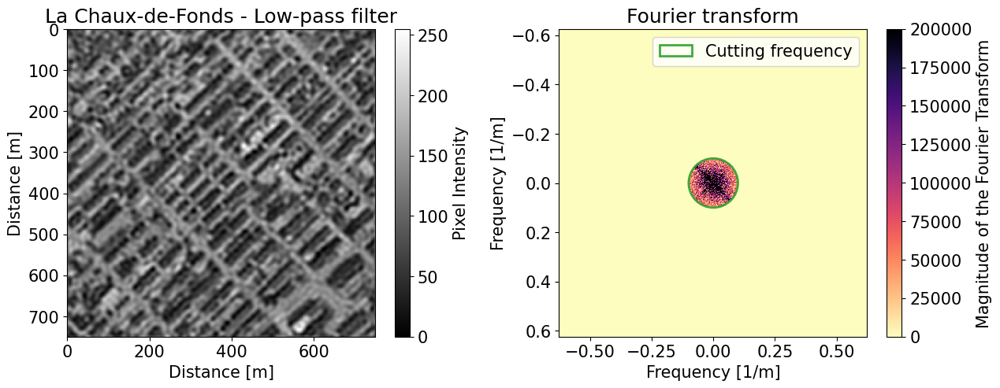

In [7]:
# ------------------------------------------------------------------------
# Change the following variable, containing the cutting frequency in [1/m]
CUTTING_FREQUENCY = 0.1
# ------------------------------------------------------------------------

# Load the image
img = np.array(PIL.Image.open("Data/1_Fourier/la_chaux_de_fonds.png"))

# Perform the Fourier transform
img_fft = np.fft.fft2(img)

# Resolution of a pixel
pix_res = 0.8 # m

# Perform low-pass filtering on the image
img_lowpass, img_lowpass_fft_filt = fft_filter(img_fft, 'lowpass', CUTTING_FREQUENCY, pix_res)

# Shifts the zero-frequency component of the masked FFT to the center of the spectrum
img_lowpass_fft_filt_centered = np.fft.fftshift(img_lowpass_fft_filt)

# Define the shifted coordinates array 
dim_x = img_lowpass_fft_filt_centered.shape[1]
dim_y = img_lowpass_fft_filt_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# Define the x and y axis for the plot of the filtered image
filt_x = np.arange(0, dim_x) / pix_res
filt_y = np.arange(0, dim_y) / pix_res

# Retrieve the magnitude of the frequency spectrum and of the inverse Fourier transform
img_lowpass_fft_filt_centered_magnitude = np.absolute(img_lowpass_fft_filt_centered)
img_lowpass_magnitude = np.absolute(img_lowpass) 

# Displaying the results
fig, axes = plt.subplots(1,2,figsize=(13,5))

ax0 = axes[0]
ax0.set_aspect('equal')
mappable = ax0.pcolormesh(filt_x, filt_y,
                          img_lowpass_magnitude, 
                          cmap='gray', vmin=0, vmax=255,
                          shading='auto')
ax0.invert_yaxis()
plt.sca(ax0)
plt.colorbar(mappable=mappable, label='Pixel Intensity')
ax0.set_xlabel('Distance [m]')
ax0.set_ylabel('Distance [m]')
ax0.set_title('La Chaux-de-Fonds - Low-pass filter')

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x, new_y,
                          img_lowpass_fft_filt_centered_magnitude, 
                          cmap='magma_r',
                          vmin=0., vmax=2e5, 
                          shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform')
# Adding a circle highlighting the filter
circle = Circle((0, 0), radius=CUTTING_FREQUENCY, 
                facecolor='none', edgecolor='tab:green', 
                linewidth=2, alpha=0.9, 
                label='Cutting frequency')
ax1.add_patch(circle)
# Labels and legend
ax1.legend()
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform')

plt.tight_layout()
plt.show()

fig_fpath = 'Figures/la_chaux_de_fonds_fourier_lowpass_' + str(CUTTING_FREQUENCY) + ".png"
fig.savefig(fig_fpath, dpi=300, bbox_inches='tight')


By modifying the value of `CUTTING_FREQUENCY` in the previous cell, you can observe the effects of more and less restrictive low-pass filters on the image.

You are now ready to answer the next question of the exercise:

> **Question 5**: What is the effect of a low-pass filter on the image? What effect does the modification of `CUTTING_FREQUENCY` have on the final result?


We can now apply the high-pass filter to the image.
The procedure follows closely the one used for the low-pass filter.

Like before, run the following cell a first time as it is, and then change the value of the variable `CUTTING_FREQUENCY`. 
Note that each time you change the `CUTTING_FREQUENCY`, a different image is saved in the `Figures/` directory to facilitate the comparison between frequency thresholds.

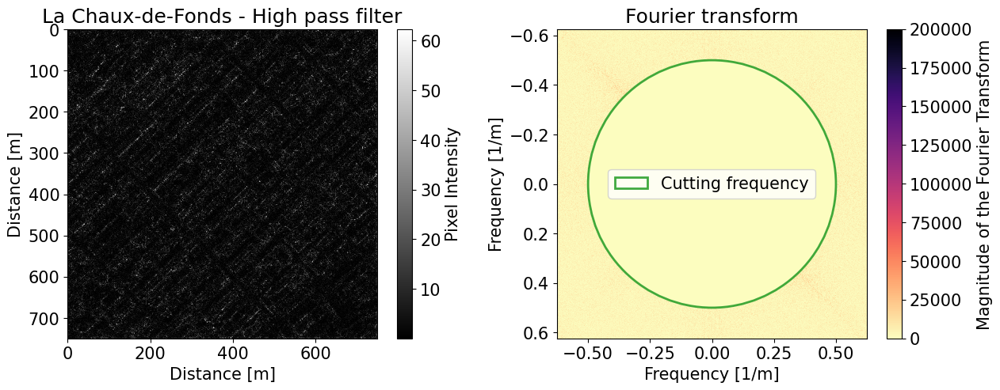

In [5]:
# ------------------------------------------------------------------------
# Change the following variable, containing the cutting frequency in [1/m]
CUTTING_FREQUENCY = 0.5
# ------------------------------------------------------------------------

# Resolution of a pixel
pix_res = 0.8 # m

# Filtering the image
img_highpass, img_highpass_fft_filt = fft_filter(img_fft, 'highpass', CUTTING_FREQUENCY, pix_res)

# Shifting the zero-frequency component of the masked FFT to the center of the spectrum
img_highpass_fft_filt_centered = np.fft.fftshift(img_highpass_fft_filt)

# Define the shifted coordinates array 
dim_x = img_highpass_fft_filt_centered.shape[1]
dim_y = img_highpass_fft_filt_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# Define the x and y axis for the plot of the filtered image
filt_x = np.arange(0, dim_x) / pix_res
filt_y = np.arange(0, dim_y) / pix_res

# Retrieve the magnitude of the frequency spectrum and of the inverse fourier transform
img_highpass_fft_filt_centered_magnitude = np.absolute(img_highpass_fft_filt_centered)
img_highpass_magnitude = np.absolute(img_highpass)

# Displaying the results
fig, axes = plt.subplots(1,2,figsize=(13,5))

ax0 = axes[0]
ax0.set_aspect('equal')
ax0.invert_yaxis()
mappable = ax0.pcolormesh(filt_x, filt_y, 
                          img_highpass_magnitude, 
                          cmap='gray',
                          shading='auto')
plt.sca(ax0)
plt.colorbar(mappable=mappable, label='Pixel Intensity')
ax0.set_xlabel('Distance [m]')
ax0.set_ylabel('Distance [m]')
ax0.set_title('La Chaux-de-Fonds - High pass filter')

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x, new_y,
                          img_highpass_fft_filt_centered_magnitude, 
                          cmap='magma_r',
                          vmin=0., vmax=2e5, 
                          shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform')
# Adding a circle highlighting the filter
circle = Circle((0, 0), radius=CUTTING_FREQUENCY, 
                facecolor='none', edgecolor='tab:green', 
                linewidth=2, alpha=0.9, label='Cutting frequency')
ax1.add_patch(circle)
# Labels and legend
ax1.legend()
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform')

plt.tight_layout()
plt.show()

fig_fpath = 'Figures/la_chaux_de_fonds_fourier_highpass_' + str(CUTTING_FREQUENCY) + ".png"
fig.savefig(fig_fpath, dpi=300, bbox_inches='tight')

Similarly to the low-pass case, by modifying the value of `CUTTING_FREQUENCY` in the previous cell you can observe the effects of more and less restrictive high-pass filters on the image. Pay attention to the color scale.

> **Question 6**: What is the effect of a high-pass filter on the image? What effect does the modification of `CUTTING_FREQUENCY` have on the final result?

Now we will sum the images obtained from the low-pass and high-pass filters, with the same cutting frequency, in the previous two code cells.

**Attention**: Remember to run again the cell setting the same cutting frequency (variable: `CUTTING_FREQUENCY`) before running the next cell!!

The result will be visualized side by side with the original La Chaux-de-Fonds image.

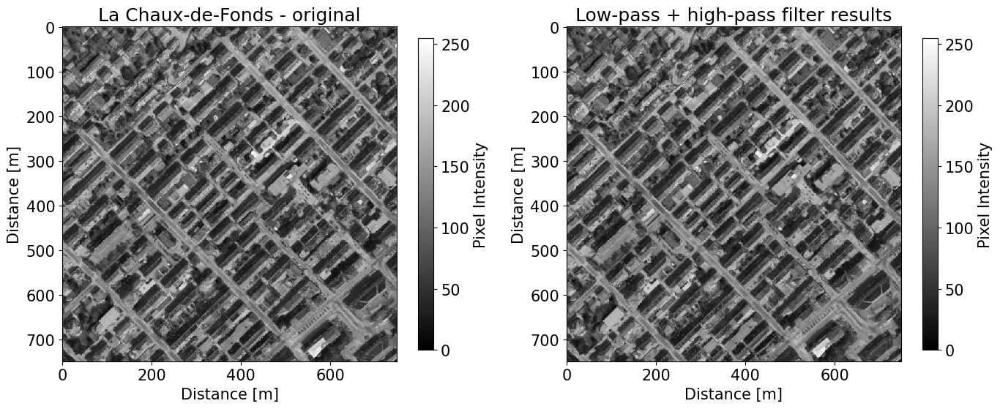

In [6]:
# Sum low-pass and high-pass filter results
img_filter_sum = img_lowpass + img_highpass
img_filter_sum_magnitude = np.absolute(img_filter_sum)

# Displaying the results
fig, axes = plt.subplots(1,2,figsize=(14,6))

ax0 = axes[0]
ax0.set_aspect('equal')
ax0.invert_yaxis()
mappable0 = ax0.pcolormesh(filt_x, filt_y, img, 
                           cmap='gray', vmin=0, vmax=255, 
                           shading='auto')
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity',shrink=0.8)
ax0.set_xlabel('Distance [m]')
ax0.set_ylabel('Distance [m]')
ax0.set_title('La Chaux-de-Fonds - original')

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable1 = ax1.pcolormesh(filt_x, filt_y, 
                           img_filter_sum_magnitude,
                           cmap='gray', vmin=0, vmax=255, 
                           shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable1, label='Pixel Intensity',shrink=.8)
ax1.set_xlabel('Distance [m]')
ax1.set_ylabel('Distance [m]')
ax1.set_title('Low-pass + high-pass filter results')

plt.tight_layout()
plt.show()
fig.savefig('Figures/cdf_highpass_lowpass.png',dpi=300,bbox_inches='tight')


Visually compare the original image and the one obtained from the sum of the low-pass and high-pass filter result.

> **Question 7**: What do you observe? Explain.


We are now at the end of this subsection.

Let's clear up the workspace: run the next cell to remove all variables, and re-load the needed libraries.

In [13]:
# Let's clear up the workspace
%reset -sf

# And re-loading the libraries
import numpy as np               # Array manipulation
import PIL.Image                 # Manipulation of images
import matplotlib.pyplot as plt  # Plotting
plt.rcParams['font.size']=15
plt.rcParams['figure.facecolor']='white'

### 1.3 Stripes on a Landsat image

On the 31st of May 2003, the Scan Line Corrector (SLC) carried by the Landsat 7 satellite, together with the Enhanced Thematic Mapper Plus (ETM+) sensor, failed. This instrument consists of a pair of small mirrors that rotate about an axis in tandem with the motion of the main ETM+ scan mirror. The purpose of the SLC is to compensate for the forward motion (along-track) of the spacecraft so that the resulting scans are aligned parallel to each other. Without the adjustment of the SLC, the instrument images the Earth in a ”zig-zag”. As a result, the scanned image is contaminated with black stripes.

We will now visualize an example of Landsat image of the Northern Jura affected by this issue. The product chosen is the "LandsatLook Natural Color Image". The image has been cropped and scaled to reduce its size and allow a faster manipulation.

Size of the image:  (1050, 1500, 3)


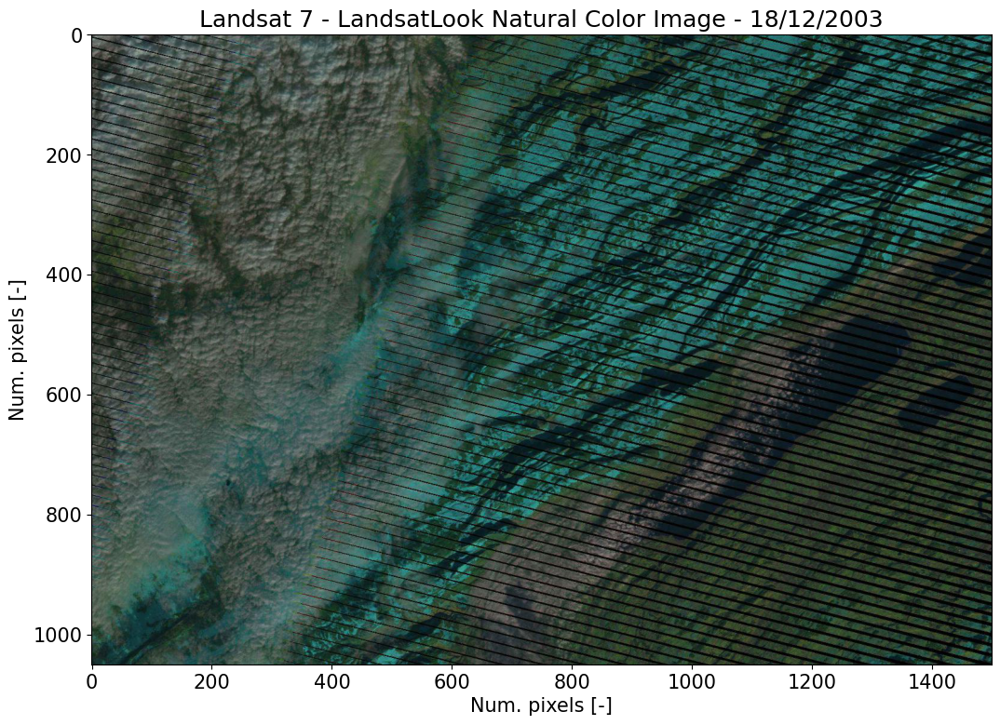

In [2]:
# Loading the image
img_RGB = np.array(PIL.Image.open("Data/1_Fourier/landsat7.jpg"))

# Print the size of the image
print('Size of the image: ', img_RGB.shape)

# Displaying the image
fig, ax = plt.subplots(1,1,figsize=(11,8))
mappable = ax.imshow(img_RGB)
ax.set_xlabel('Num. pixels [-]')
ax.set_ylabel('Num. pixels [-]')
ax.set_title('Landsat 7 - LandsatLook Natural Color Image - 18/12/2003')
ax.set_aspect('equal')
plt.tight_layout()
plt.show()
fig.savefig('Figures/Landsat_original.png',dpi=300,bbox_inches='tight')


To simplify the following analysis, we will focus only on the second band of the image: the **green** one.

Repeating the procedure used in the previous sections on the aerial image of La Chaux-de-Fonds, we will compute the Fourier transform for the second component of the Landsat 7 image.

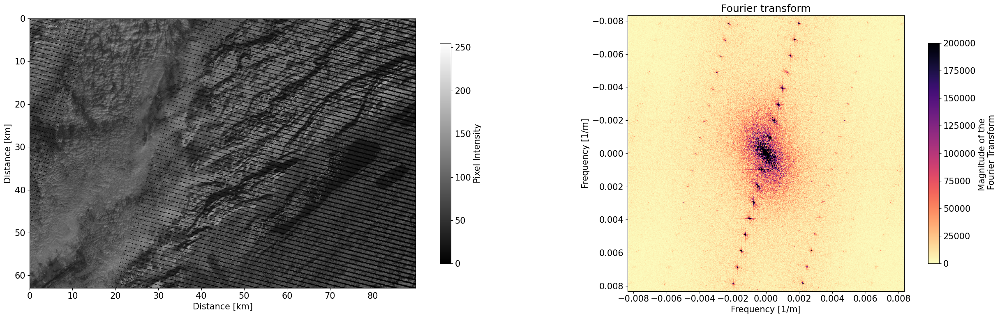

In [3]:
# Select the green band 
img = img_RGB[:,:,1] 

# Resolution of a pixel
# Note: resolution of Landsat7 multiplied by the factor used in scaling the image to reduce its size
pix_res = 30. * 2. # m

# Perform the Fourier transform
img_fft = np.fft.fft2(img)

# Shift the zero-frequency component to the center of the spectrum
img_fft_centered = np.fft.fftshift(img_fft)

# Define the shifted coordinates array
dim_x = img_fft_centered.shape[1]
dim_y = img_fft_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# Define the x and y axis to plot the original Landsat7 image view (in km)
orig_x = np.arange(0, dim_x) * pix_res / 1000
orig_y = np.arange(0, dim_y) * pix_res / 1000

# Retrieve the magnitude of the frequency spectrum 
img_fft_centered_magnitude = np.absolute(img_fft_centered)

# Plotting the results and the Landsat image
fig, axes = plt.subplots(1,2,figsize=(25,8))

ax0 = axes[0]
ax0.set_aspect('equal')
ax0.invert_yaxis()
mappable0 = ax0.pcolormesh(orig_x, orig_y, img,
                           cmap='gray', vmin=0, vmax=255, 
                           shading='auto')
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity', shrink=0.8)
ax0.set_xlabel('Distance [km]')
ax0.set_ylabel('Distance [km]')
ax0.set_title('')

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x, new_y,
                          img_fft_centered_magnitude, 
                          cmap='magma_r',
                          vmin=0., vmax=2e5, 
                          shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the \n Fourier Transform',shrink=0.8)
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform')

plt.tight_layout()
plt.show()

fig.savefig('Figures/Landsat_w_Fourier.png',dpi=300,bbox_inches='tight')


Have a look at the original image and the magnitude of the Fourier transform.

> **Question 8**: Where do you see the signature of the stripes on the spectrum? Give an explanation.

> **Question 9**: How would the Fourier spectrum be different if the stripes on the Landsat image were more spaced out (larger distance between two stripes)?

We will now define a function, *pie_slice_filter*, that filters the 2D Fourier transform of the original image.
Like the simple low-pass and high-pass filters of subsection 1.2, this function will take multiple arguments as input:
- **im_fft**, the Fourier transform of the image that we want to filter. The zero frequency must be at the center.
- **angle_center**, the direction in which we will filter the Fourier transform. Must be between -180° and 180°.
- **angle_width**, the width in degrees of the slice that we will filter out
- **min_freq**, the minimal frequency that is affected by the filter in [1/m]
- **pix_res**, the pixel resolution in [m] (in our case 60.0 m)

In [4]:
def pie_slice_filter(im_fft, angle_center, angle_width, min_freq, pix_res=60.):
    '''
    Filtering specific angles of the Fourier transform.
    
    
    Parameters
    ----------
    im_fft : complex numpy array (2D)
        The Fourier transform of the image to filter. The zero frequency must be at the center.
    angle_center : float
        The direction in which we will filter the Fourier transform.
    angle_width : float
        The width in degrees of the slice that we will filter out.
    min_freq : float
        The minimal frequency that is affected by the filter [1/m].
    pix_res : float
        Pixel resolution in [m]
        
    Returns
    -------
    im_filt : complex numpy array (2D)
        The filtered image (complex array). Compute the absolute value before visualizing.
    filt_fft : complex numpy array (2D)
        The masked Fourier transform used to perform the filtering
    '''
    # Checking the validity of the angles (does not work for angles out of [-360, 360])
    if angle_center > 180.:
        angle_center -= 180
    elif angle_center < -180.:
        angle_center += 180
    
    # The image dimensions
    dim_x = im_fft.shape[1]
    dim_y = im_fft.shape[0]

    # Let' work with the 0 frequency at the center of the image
    new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
    new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y
    
    x2d, y2d = np.meshgrid(new_x, new_y)
    freq = np.sqrt(np.square(x2d) + np.square(y2d))
    
    # Computing the angle for each direction in the image matrix
    img_angles = np.degrees(np.arctan2(x2d, y2d))

    # Creating the mask
    freq_mask = np.ones(im_fft.shape, dtype='bool')
    # 1) Condition on the angles
    # Direction 1
    min_freq_1 = angle_center - angle_width/2.
    max_freq_1 = angle_center + angle_width/2.

    cond_1 = np.logical_and(img_angles > min_freq_1, img_angles < max_freq_1)
    if min_freq_1 < -180.:
        cond_1 = np.logical_or(cond_1, img_angles > min_freq_1+360.)
    if max_freq_1 > 180.:
        cond_1 = np.logical_or(cond_1, img_angles < max_freq_1-360.)

    # Direction 1 + 180
    if angle_center > 0.:
        center2 = angle_center - 180.
    else:
        center2 = angle_center + 180.
    
    min_freq_2 = center2 - angle_width/2.
    max_freq_2 = center2 + angle_width/2.
    
    cond_2 = np.logical_and(img_angles > min_freq_2, img_angles < max_freq_2)
    if min_freq_2 < -180.:
        cond_2 = np.logical_or(cond_2, img_angles > min_freq_2+360.)
    if max_freq_2 > 180.:
        cond_2 = np.logical_or(cond_2, img_angles < max_freq_2-360.)

    cond = np.logical_or(cond_1, cond_2)
    freq_mask[cond] = False

    # 2) Condition on the minimum frequency
    freq_mask[freq < min_freq] = True
    
    # The frequency masked
    filt_fft = np.multiply(im_fft, freq_mask)
    
    # Inverse Fourier transform
    im_filt_complex = np.fft.ifft2(np.fft.ifftshift(filt_fft))
    
    return im_filt_complex, filt_fft

Since the 0° position of **angle_center** is arbitrary, we decided to set it along the positive section of the vertical axis. Angles clockwise from there will be negative (0° -> 180°), and angles counterclockwise from there will be positive.

If the explanation above is not clear enough, we wrote the following cell to display the values of the angles on a matrix created ad hoc.
Run it to visualize which angle has been assigned to the directions in an arbitrary image.

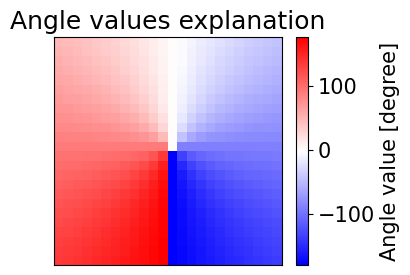

In [17]:
#  Generating the coordinate matrices
a = np.arange(-12, 12)
b = np.arange(-12, 12)
aa, bb = np.meshgrid(a,b)

# Plotting the angles
fig, ax = plt.subplots(1, 1, figsize=(4,3))
ax.set_aspect('equal')
mappable = ax.pcolormesh(aa, bb , -np.degrees(np.arctan2(aa, bb)), 
                         cmap='bwr', shading="auto")
ax.set_xticks([])
ax.set_yticks([])
plt.sca(ax)
plt.colorbar(mappable=mappable, label='Angle value [degree]')
ax.set_title('Angle values explanation')
plt.tight_layout()
plt.show()

We will now apply the *pie_slice_filter* function on the same Landsat 7 band.

Here, we provide the code to perform the filtering, but the values of the parameters that we have set are not optimal.
The visualization of the result is already coded in the cell.

**You will have to modify three variables in the next cell**:
- `ANGLE_CENTER`
- `ANGLE_WIDTH`
- `MIN_FREQ`

Choose the values that you think work best in our case so that the filtered/reconstructed image has as little black stripes as possible.

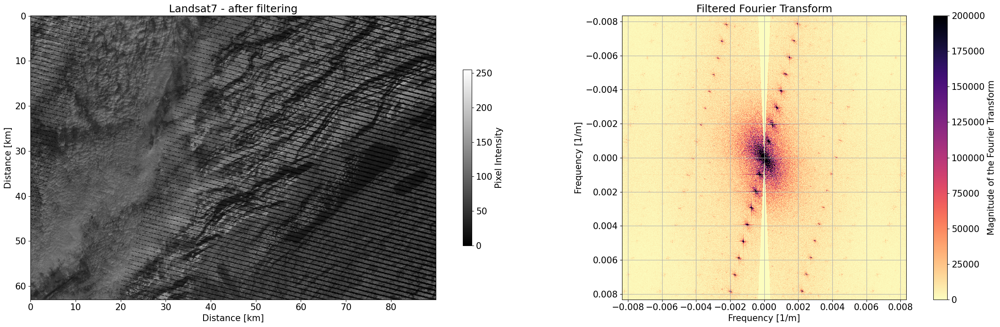

In [5]:
# -----------------------------
# The three variables to modify
ANGLE_CENTER = 0
ANGLE_WIDTH = 5
MIN_FREQ = 0.0003
# -----------------------------

#  Resolution of a pixel
pix_res = 30. * 2. # m

# Filtering the image
img_pie_slice, img_pie_slice_filt_centered = pie_slice_filter(img_fft_centered,
                                                              ANGLE_CENTER,
                                                              ANGLE_WIDTH,
                                                              MIN_FREQ,
                                                              pix_res)

# Define the shifted coordinates array
dim_x = img_pie_slice_filt_centered.shape[1]
dim_y = img_pie_slice_filt_centered.shape[0]
new_x = np.arange(-np.floor(dim_x/2.), np.floor(dim_x/2.)) / pix_res / dim_x
new_y = np.arange(-np.floor(dim_y/2.), np.floor(dim_y/2.)) / pix_res / dim_y

# The absolute value of the array
img_pie_slice_filt_centered_magnitude = np.absolute(img_pie_slice_filt_centered)
img_pie_slice_magnitude = np.absolute(img_pie_slice)

# The x and y axis for the plot of the filtered image
filt_x = np.arange(0, dim_x) * pix_res
filt_y = np.arange(0, dim_y) * pix_res

# Displaying the results 
fig, axes = plt.subplots(1,2,figsize=(25,8))
ax0 = axes[0]
ax0.set_aspect('equal')
mappable = ax0.pcolormesh(filt_x/1000., filt_y/1000.,
                          img_pie_slice_magnitude,
                          cmap='gray', vmin=0, vmax=255, 
                          shading='auto')
ax0.invert_yaxis()
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity', shrink=0.62, ax = ax0)
ax0.set_xlabel('Distance [km]')
ax0.set_ylabel('Distance [km]')
ax0.set_title('Landsat7 - after filtering')
plt.tight_layout()

ax1 = axes[1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x, new_y, 
                          img_pie_slice_filt_centered_magnitude,
                          cmap='magma_r',
                          vmin=0., vmax=2e5, 
                          shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform', ax = ax1)
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Filtered Fourier Transform')
plt.grid()
plt.tight_layout()
plt.show()
fig.savefig('Figures/Landsat_w_Fourier_filtered',dpi=300,bbox_inches='tight')


After investigating the effect of changing the three variables in the prevous cell, you are ready to reply to the next question of the exercise.

> **Question 10**: What are, in your opinion, the best values for the three parameters (ANGLE_CENTER', ANGLE_WIDTH, MIN_FREQ)? Explain the reasoning behind your choice.

> **Question 11**: Even with the "optimal" set of values, the result is quite far from "perfect". What artefacts do you see? What areas are problematic?

In [19]:
# Let's clear up the workspace.
%reset -sf

# And re-loading the libraries
import numpy as np               # Array manipulation
import PIL.Image                 # Manipulation of images
import matplotlib.pyplot as plt  # Plotting
plt.rcParams['font.size']=15
plt.rcParams['figure.facecolor']='white'

### 1.4 Global enhancement of LandSat image
We will now tackle another aspect of the LandSat image provided, i.e. its apparent darkness or underexposition (see the first figure in subsection 1.3). To this end, we will implement the global enhancement method presented during class.

First, we load the image once again and plot the histograms of the red, green and blue bands.


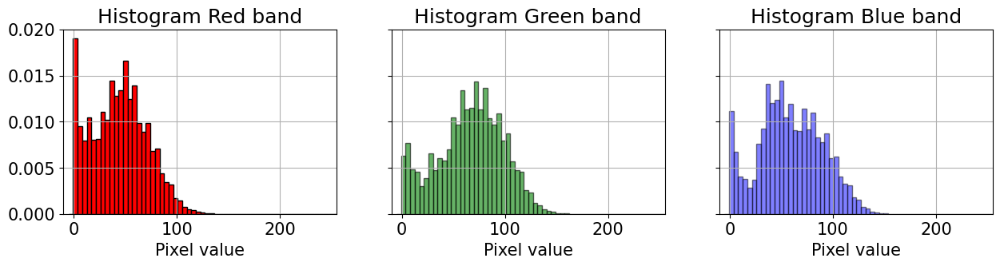

In [20]:
# Load the image
img_RGB = np.array(PIL.Image.open("Data/1_Fourier/landsat7.jpg"))

# Plot the histograms of R G B bands
fig,axes = plt.subplots(1,3,figsize=(15,3),sharex=True,sharey=True)
bins = np.linspace(-5,255,60)
axes[0].hist(img_RGB[:,:,0].flatten(), bins=bins, density=True, color='red', edgecolor='k')
axes[1].hist(img_RGB[:,:,1].flatten(), bins=bins, density=True, color='green', alpha=.6, edgecolor='k')
axes[2].hist(img_RGB[:,:,2].flatten(), bins=bins, density=True, color='blue', alpha=.5, edgecolor='k')
axes[0].grid()
axes[1].grid()
axes[2].grid()
plt.xlim(-10,255)
axes[0].set_title('Histogram Red band')
axes[1].set_title('Histogram Green band')
axes[2].set_title('Histogram Blue band')
axes[0].set_xlabel('Pixel value')
axes[1].set_xlabel('Pixel value')
axes[2].set_xlabel('Pixel value')
fig.savefig('Figures/Landsat7_histograms',dpi=300,bbox_inches='tight')

> **Question 12**: Briefly describe the histograms. Do these histograms confirm the dark appearance of the Landsat image to the eye? Can you identify signatures from certain features in the image? 

We now implement the equation given in the course slides for global enhancement through linear normalisation:

$DN_n = (DN_0 - DN_{0,min}) \frac{DN_{n,max} - DN_{n,min}}{DN_{0,max} - DN_{0,min}} + DN_{n,min}$

In the previous equation, $DN_0$ is the original landsat image. In the cell below, we define the corresponding variable accordingly (`DN0`).

In [21]:
# First, let's convert the integer array to a floating point array 
DN0 = img_RGB.astype('float')

The following cell contains the implementation of the linear normalisation formula, and the visualization of the resulting enhanced image. 

Values of $DN_{0,min}$, $DN_{0,max}$, $DN_{n,max}$, $DN_{n,min}$, i.e. respectively `DN0MIN, DN0MAX, DNNMAX, DNNMIN` are set to arbitrary, meaningless values.\
You should now set them to their true values. Note: You can use basic python functions (e.g. sum, mean, min, max, ...), see https://numpy.org/doc/stable/reference/routines.statistics.html

> **Question 13**: What are the correct values for the following variables: $DN_{0,min}$, $DN_{0,max}$, $DN_{n,max}$, $DN_{n,min}$? Briefly explain your reasoning, and include the resulting enhanced image. Give an appreciation of the result.



In [22]:
# -----------------------------
# The four variables to modify
DN0MIN = -999
DN0MAX = -999
DNNMAX = -999
DNNMIN = -999 
# -----------------------------

# The line below is the python implementation of the linear normalisation equation
img_RGB_enhanced = (DN0-DN0MIN)*(DNNMAX-DNNMIN)/(DN0MAX-DN0MIN)+DNNMIN

/tmp/ipykernel_157/3571705615.py:10: RuntimeWarning: invalid value encountered in divide
  img_RGB_enhanced = (DN0-DN0MIN)*(DNNMAX-DNNMIN)/(DN0MAX-DN0MIN)+DNNMIN


/tmp/ipykernel_157/2038245987.py:2: RuntimeWarning: invalid value encountered in cast
  img_RGB_enhanced = np.abs(img_RGB_enhanced).astype('uint8')


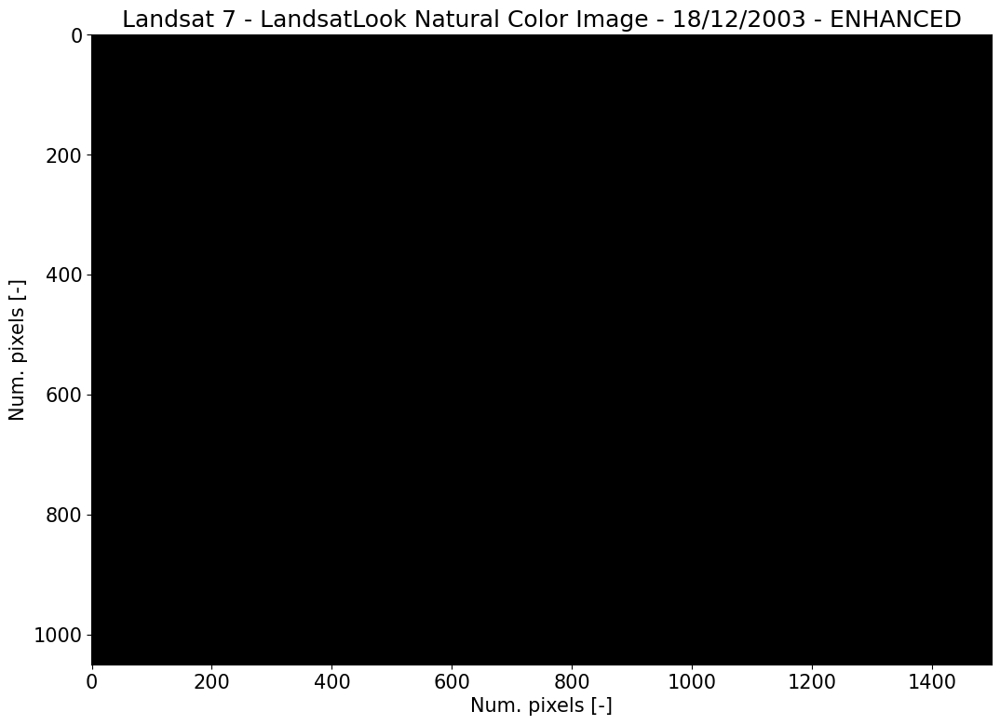

In [23]:
# Convert the enhanced image back to an integer array 
img_RGB_enhanced = np.abs(img_RGB_enhanced).astype('uint8')

# Plot the enhanced RGB image
fig, ax = plt.subplots(1,1,figsize=(11,8))
mappable = ax.imshow(img_RGB_enhanced, vmin=0, vmax=255)
ax.set_xlabel('Num. pixels [-]')
ax.set_ylabel('Num. pixels [-]')
ax.set_title('Landsat 7 - LandsatLook Natural Color Image - 18/12/2003 - ENHANCED')
ax.set_aspect('equal')
plt.tight_layout()
plt.show()
fig.savefig('Figures/Landsat7_with_stripes_enhanced',dpi=300,bbox_inches='tight')